# Remedial Modul 3

# Data Detail
- Rooms: Number of rooms

- Price: Price in dollars

- Method: S - property sold; SP - property sold prior; PI - property passed in; PN - sold prior not disclosed; SN - sold not disclosed; NB - no bid; VB - vendor bid; W - withdrawn prior to auction; SA - sold after auction; SS - sold after auction price not disclosed. N/A - price or highest bid not available.

- Type: 
         br - bedroom(s); 
         h - house,cottage, villa, semi, terrace; 
         u - unit, duplex; 
         t - townhouse; dev site - development site; 
         o res - other residential.

- SellerG: Real Estate Agent

- Date: Date sold

- Distance: Distance from CBD

- Regionname: General Region (West, North West, North, North east …etc)

- Propertycount: Number of properties that exist in the suburb.

- Bedroom2 : Scraped # of Bedrooms (from different source)

- Bathroom: Number of Bathrooms

- Car: Number of carspots

- Landsize: Land Size

- BuildingArea: Building Size

- CouncilArea: Governing council for the area

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
%matplotlib inline

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [4]:
# membaca dataset 
houseData = pd.read_csv("melb_data.csv")
houseData = houseData.iloc[0:5000] #membaca 5000 data 
# menampilkan sample data
houseData.head() 

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [5]:
len(houseData['Address'])

5000

In [6]:
houseData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
Suburb           5000 non-null object
Address          5000 non-null object
Rooms            5000 non-null int64
Type             5000 non-null object
Price            5000 non-null float64
Method           5000 non-null object
SellerG          5000 non-null object
Date             5000 non-null object
Distance         5000 non-null float64
Postcode         5000 non-null float64
Bedroom2         5000 non-null float64
Bathroom         5000 non-null float64
Car              5000 non-null float64
Landsize         5000 non-null float64
BuildingArea     2838 non-null float64
YearBuilt        3224 non-null float64
CouncilArea      5000 non-null object
Lattitude        5000 non-null float64
Longtitude       5000 non-null float64
Regionname       5000 non-null object
Propertycount    5000 non-null float64
dtypes: float64(12), int64(1), object(8)
memory usage: 820.4+ KB


# Data Cleaning & Preprocessing

- Setelah diperhatikan type data nya, semua Feature tidak ada yang salah dengan Type datanya.
- Jika diperhatikan jumlah datanya, dapat disimpulkan bahwa ada Null Value di feature 'BuildingArea','YearBuilt'.

## Handling Null values

In [7]:
houseData.isna().sum()

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2            0
Bathroom            0
Car                 0
Landsize            0
BuildingArea     2162
YearBuilt        1776
CouncilArea         0
Lattitude           0
Longtitude          0
Regionname          0
Propertycount       0
dtype: int64

In [8]:
#BuildingArea NullVall

houseData['BuildingArea'].describe()

count    2838.000000
mean      150.624031
std       178.182062
min         0.000000
25%        90.000000
50%       125.000000
75%       176.000000
max      6791.000000
Name: BuildingArea, dtype: float64

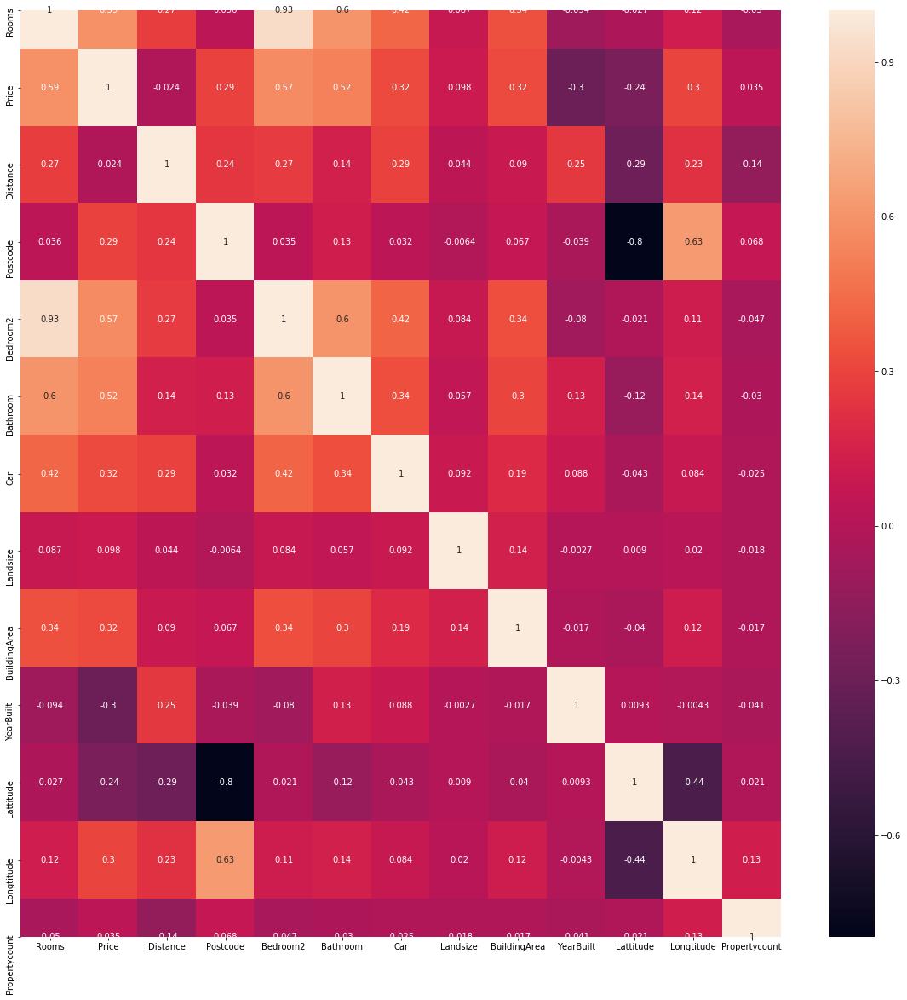

In [9]:
#Melihat Corelasi secara keseluruhan
plt.figure(figsize = (20,20))
sns.heatmap(houseData.corr(), annot = True)

Jika dilihat dari korelasi secara keseluruhan,tidak ada yang hubungannya erat dengan Buildings area,

Namun feature BuildingArea sendiri adalah luas bangunan, dimana asumsi saya luas bangunan berhubungan dengan jumlah  ruangan (Feature Room)

In [10]:
houseData['Rooms'].describe()

count    5000.000000
mean        2.888800
std         0.963649
min         1.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         8.000000
Name: Rooms, dtype: float64

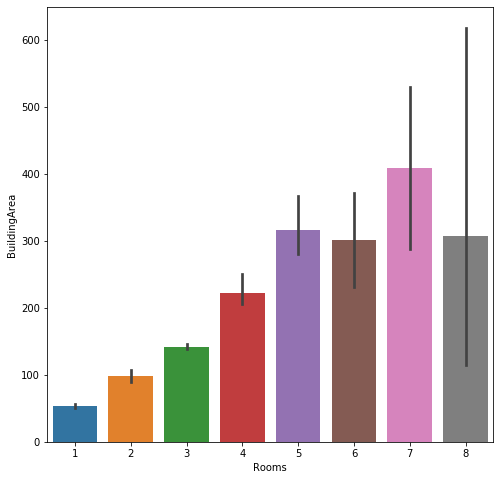

In [11]:
plt.figure(figsize = (8,8)) 

sns.barplot(data = houseData, x='Rooms', y='BuildingArea')

dilihat dari visualisasi diatas saya menemukan kebanyakan rumah dengan jumlah room sedikit luar bangunannya juga lebih sedikit, sehingga saya menggunakan Feature Rooms sebagai patokan mengisi missing values yang terdapat pada Buildings area.
dimana

Jika jumlah ruangan (Rooms) <= 2, maka Null Value BuildingsAreanya diisi dengan Q1 dari BuildingsArea
Jika jumlah ruangan (Rooms) > 2 & <= 4, maka Null Value BuildingsAreanya diisi dengan median dari BuildingsArea
Jika jumlah ruangan (Rooms) > 4 & <= 6, maka Null Value BuildingsAreanya diisi dengan Q3 dari BuildingsArea
dan Jika jumlah ruangan (Rooms) > 6, maka Null Value BuildingsAreanya diisi dengan Max dari BuildingsArea

In [12]:
house1 = houseData[houseData['Rooms'] <= 2].describe()['BuildingArea']['25%']
house2 = houseData[(houseData['Rooms'] > 2) & (houseData['Rooms'] <= 4)].describe()['BuildingArea']['50%']
house3 = houseData[(houseData['Rooms'] > 4) & (houseData['Rooms'] <= 6 )].describe()['BuildingArea']['75%']
house4 = houseData[houseData['Rooms'] > 6 ].describe()['BuildingArea']['max']

locHouse1 = houseData[(houseData['Rooms'] <= 2) & (houseData['BuildingArea'].isna() == True)]['BuildingArea'].index
locHouse2 = houseData[((houseData['Rooms'] > 2) & (houseData['Rooms'] <= 4)) & (houseData['BuildingArea'].isna() == True)]['BuildingArea'].index
locHouse3 = houseData[((houseData['Rooms'] > 4) & (houseData['Rooms'] <= 6)) & (houseData['BuildingArea'].isna() == True)]['BuildingArea'].index
locHouse4 = houseData[(houseData['Rooms'] > 6) & (houseData['BuildingArea'].isna() == True)]['BuildingArea'].index

houseData['BuildingArea'].iloc[locHouse1] = houseData['BuildingArea'].iloc[locHouse1].fillna(house1)
houseData['BuildingArea'].iloc[locHouse2] = houseData['BuildingArea'].iloc[locHouse2].fillna(house2)
houseData['BuildingArea'].iloc[locHouse3] = houseData['BuildingArea'].iloc[locHouse3].fillna(house3)
houseData['BuildingArea'].iloc[locHouse4] = houseData['BuildingArea'].iloc[locHouse4].fillna(house4)

pd.set_option('display.max_rows', None)
houseData

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,66.0,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,148.0,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0
5,Abbotsford,129 Charles St,2,h,941000.0,S,Jellis,7/05/2016,2.5,3067.0,...,1.0,0.0,181.0,66.0,NaN,Yarra,-37.8041,144.9953,Northern Metropolitan,4019.0
6,Abbotsford,124 Yarra St,3,h,1876000.0,S,Nelson,7/05/2016,2.5,3067.0,...,2.0,0.0,245.0,210.0,1910.0,Yarra,-37.8024,144.9993,Northern Metropolitan,4019.0
7,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,8/10/2016,2.5,3067.0,...,1.0,2.0,256.0,107.0,1890.0,Yarra,-37.8060,144.9954,Northern Metropolitan,4019.0
8,Abbotsford,6/241 Nicholson St,1,u,300000.0,S,Biggin,8/10/2016,2.5,3067.0,...,1.0,1.0,0.0,66.0,NaN,Yarra,-37.8008,144.9973,Northern Metropolitan,4019.0
9,Abbotsford,10 Valiant St,2,h,1097000.0,S,Biggin,8/10/2016,2.5,3067.0,...,1.0,2.0,220.0,75.0,1900.0,Yarra,-37.8010,144.9989,Northern Metropolitan,4019.0


In [13]:
houseData.isna().sum()

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2            0
Bathroom            0
Car                 0
Landsize            0
BuildingArea        0
YearBuilt        1776
CouncilArea         0
Lattitude           0
Longtitude          0
Regionname          0
Propertycount       0
dtype: int64

In [14]:
#BuildingArea NullVall

houseData['YearBuilt'].describe()

count    3224.000000
mean     1960.598325
std        37.699725
min      1830.000000
25%      1930.000000
50%      1960.000000
75%      1997.250000
max      2018.000000
Name: YearBuilt, dtype: float64

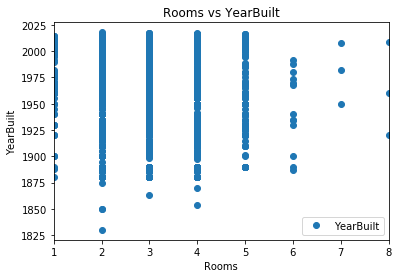

In [15]:
houseData.plot(x='Rooms', y='YearBuilt', style='o')
plt.title('Rooms vs YearBuilt')
plt.xlabel('Rooms')
plt.ylabel('YearBuilt')
plt.show()

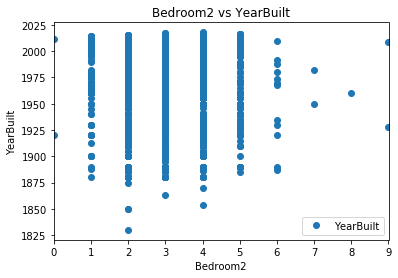

In [16]:
houseData.plot(x='Bedroom2', y='YearBuilt', style='o')
plt.title('Bedroom2 vs YearBuilt')
plt.xlabel('Bedroom2')
plt.ylabel('YearBuilt')
plt.show()

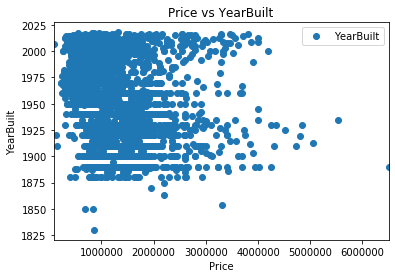

In [17]:
houseData.plot(x='Price', y='YearBuilt', style='o')
plt.title('Price vs YearBuilt')
plt.xlabel('Price')
plt.ylabel('YearBuilt')
plt.show()

Dilihat dari visualisasi diatas rummah dengan Tahun pembuatan 1850 kebawah hanya memiliki <= 2 ruangan dan <=2 jumlah kamar, namun secara keseluruhan rata2 jumlah kamar dan ruangan di tiap tahun nya bervariasi dan jumlahnya hampir merata dari 1 - 5 kamar dan 1- 5 ruangan, sehingga saya memutusnya mengisi null value dari Yearbuilt berdasarkan median dari yearbuilt nya saja. karena dari segi harga pun rumah yang dibangun Tahun 1960an harganya masih sangat bersaing dengan rumah yang dibangun tahun 2000an

In [18]:
houseData['YearBuilt'] = houseData['YearBuilt'].fillna(1960)
houseData.isna().sum()

Suburb           0
Address          0
Rooms            0
Type             0
Price            0
Method           0
SellerG          0
Date             0
Distance         0
Postcode         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
BuildingArea     0
YearBuilt        0
CouncilArea      0
Lattitude        0
Longtitude       0
Regionname       0
Propertycount    0
dtype: int64

# EDA

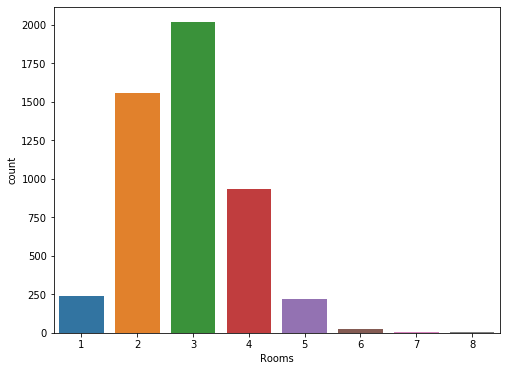

In [19]:
plt.figure(figsize = (8,6)) 
sns.countplot(x="Rooms", data=houseData)
plt.show()

Dari sample 5000 data yang diambil terlihat paling banyak rumah dengan jumlah 3 ruangan sedangkan rumah yang jumlah ruangannya 6 sampai 8 sangat sedikit

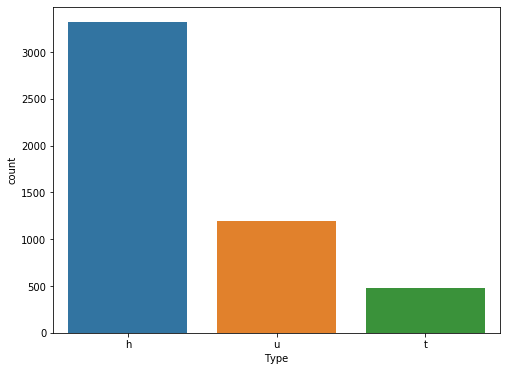

In [20]:
plt.figure(figsize = (8,6)) 
sns.countplot(x="Type", data=houseData)
plt.show()

Dari sample data yang diambil juga terlihat ternyata lebih banyak type h, yang merupakan type umum (house,cottage, villa, semi, terrace)

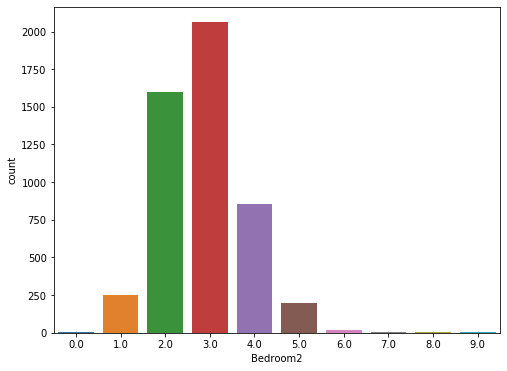

In [21]:
plt.figure(figsize = (8,6)) 
sns.countplot(x="Bedroom2", data=houseData)
plt.show()

Dari sample 5000 data yang diambil juga terlihat paling banyak rumah dengan jumlah 3 kamar sedangkan rumah yang jumlah kamar 6 sampai 9 sangat sedikit

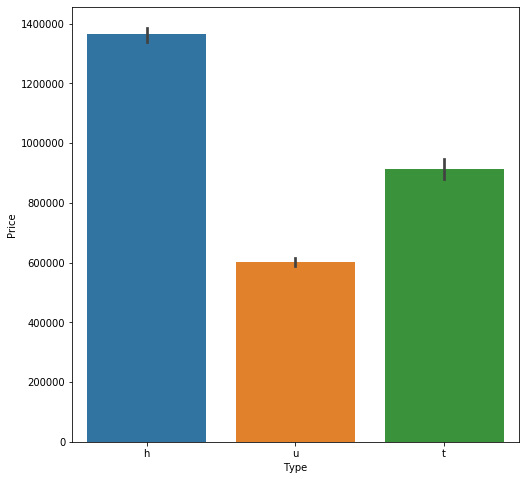

In [22]:
plt.figure(figsize = (8,8)) 

sns.barplot(data = houseData, x='Type', y='Price')

Terlihat pada visualisasi diatas Type rumah h (house,cottage, villa, semi, terrace) rata2 harganya lebih mahal terutama jika dibandingkan dengan type rumah u (unit, duplex). 
Hal tersebut sangat mungkin terjadi menimbang type tumah u merupakan type perumahan yang dempet, jarak antara rumah tidak ada kerena type duplex merupakan type rumah bersebelahan.

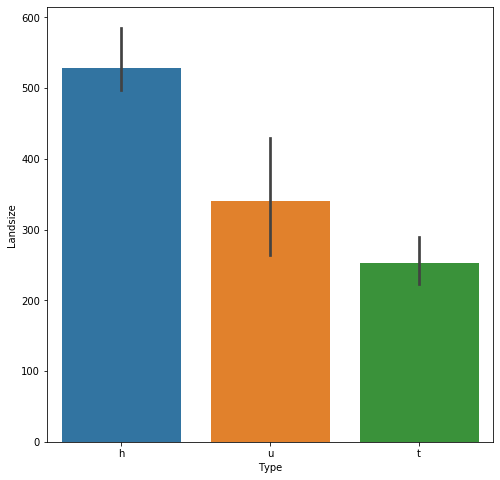

In [23]:
plt.figure(figsize = (8,8)) 

sns.barplot(data = houseData, x='Type', y='Landsize')

### Pernyataan sebelumnya didukung dengan fakta bahwa rata-rata rumah di type h lahannya lebih luas

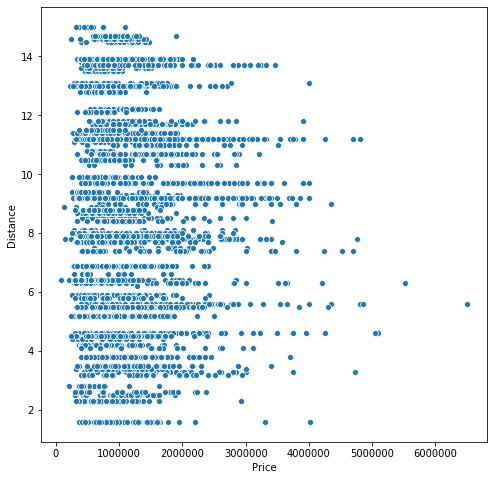

In [24]:
plt.figure(figsize = (8,8)) 
 
sns.scatterplot(data = houseData, x='Price', y='Distance')

In [25]:
houseData.Distance.describe()

count    5000.000000
mean        8.698000
std         3.396407
min         1.600000
25%         5.900000
50%         8.800000
75%        11.200000
max        15.000000
Name: Distance, dtype: float64

Feature Distance merupakan jarak dari pusat kota, dan asumsi saya, rumah yang semakin dekat dengan pusat kota akan semakin mahal harganya.

bisa dilihat juga dari visualisasi diatas dimana setelah jarak 14 Km saja terlihat harga mulai tidak ada yang mahal.

Maka Feature Distance menjadi salah sati Feature yang sangat mempengaruri harga rumah, selain type rumah dan jumlah ruangan yang ada.

dari Visualisasi diatas dapat disimpulkan jumlah ruangan yang banyak berpengaruh cukup signifikan terhadap harga

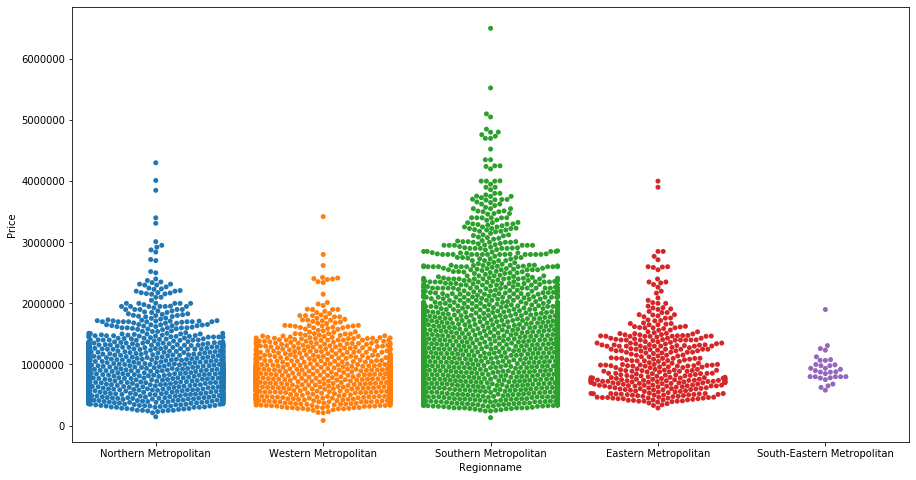

In [26]:
plt.figure(figsize = (15,8)) 

sns.swarmplot(data = houseData, x='Regionname', y='Price')

Region nya sebenarnya tidak menentukan harga penjualan rumah, namun pengaruhnya ke keputusan pembelian dimana sangat jarang yang beli atau memiliki rumah di daerah south-eastern metropolitan, tentu saja penduduk nya dan 'kehidupan' disana tidak seramai di region southern metropolitan

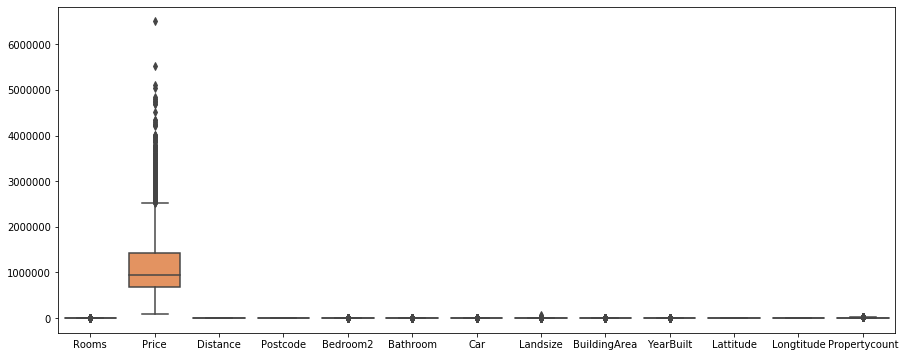

In [27]:
plt.subplots(figsize=(15,6))
sns.boxplot(data=houseData)

### Terdapat Outlier pada feature Price

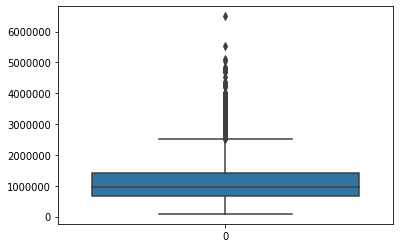

In [28]:
sns.boxplot(data=houseData['Price'])

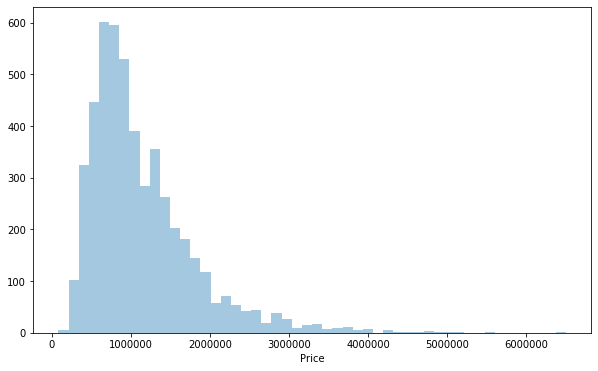

In [29]:
plt.subplots(figsize=(10,6))
sns.distplot(houseData.Price, kde=False);

### Dari visualisasi diatas terlihat paling banyak rumah itu diharga 1000000

# Building Models

In [30]:
#### Encoding categrical Features: ##########
houseData_dummies = pd.get_dummies(houseData,drop_first=True)
houseData_dummies

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,...,CouncilArea_Moonee Valley,CouncilArea_Moreland,CouncilArea_Port Phillip,CouncilArea_Stonnington,CouncilArea_Whitehorse,CouncilArea_Yarra,Regionname_Northern Metropolitan,Regionname_South-Eastern Metropolitan,Regionname_Southern Metropolitan,Regionname_Western Metropolitan
0,2,1480000.0,2.5,3067.0,2.0,1.0,1.0,202.0,66.0,1960.0,...,0,0,0,0,0,1,1,0,0,0
1,2,1035000.0,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,...,0,0,0,0,0,1,1,0,0,0
2,3,1465000.0,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,...,0,0,0,0,0,1,1,0,0,0
3,3,850000.0,2.5,3067.0,3.0,2.0,1.0,94.0,148.0,1960.0,...,0,0,0,0,0,1,1,0,0,0
4,4,1600000.0,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,...,0,0,0,0,0,1,1,0,0,0
5,2,941000.0,2.5,3067.0,2.0,1.0,0.0,181.0,66.0,1960.0,...,0,0,0,0,0,1,1,0,0,0
6,3,1876000.0,2.5,3067.0,4.0,2.0,0.0,245.0,210.0,1910.0,...,0,0,0,0,0,1,1,0,0,0
7,2,1636000.0,2.5,3067.0,2.0,1.0,2.0,256.0,107.0,1890.0,...,0,0,0,0,0,1,1,0,0,0
8,1,300000.0,2.5,3067.0,1.0,1.0,1.0,0.0,66.0,1960.0,...,0,0,0,0,0,1,1,0,0,0
9,2,1097000.0,2.5,3067.0,3.0,1.0,2.0,220.0,75.0,1900.0,...,0,0,0,0,0,1,1,0,0,0


## 1. Decision Tree Classifier

### Spliting Dataset

In [31]:
x = houseData_dummies.drop(['Price'], axis = 1)
y = houseData_dummies['Price']

In [32]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.2,random_state=0) ##menggunakan perbandingan 80:20

### Fitting Model

In [33]:
from sklearn.tree import DecisionTreeClassifier

modelTC = DecisionTreeClassifier(min_samples_split= 2, min_samples_leaf = 1, max_depth = 40)
modelTC.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=40, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

### Predict

In [34]:
y_pred = modelTC.predict(x_test) 

In [35]:
# trying to predict using model
coba = x_test.iloc[:1]
modelTC.predict(coba)
# coba

array([975000.])

### Evaluation Matrix

In [36]:
confusion_matrix(y_test, y_pred) 

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [ ]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt=".0f", ax=ax)
plt.xlabel("y Aktual")
plt.ylabel("y Prediksi")
plt.show()

## Dari sini memakan banyak waktu karena loading lama dan tidak jalan2

In [ ]:
# Confusion Matrix Report
print(classification_report(y_test, y_pred))

In [ ]:
modelTC.score(x_train, y_train)

In [ ]:
modelTC.score(x_test, y_test)

In [ ]:
accuracies = {}
acc = modelTC.score(x_test,y_test)*100
accuracies['Decision Tree Classifier'] = acc
print("Decision Tree Classifier Algorithm Accuracy Score : {:.2f}%".format(acc))

## 2. Random Forest Classifier

In [36]:
from sklearn.ensemble import RandomForestClassifier
modelRF = RandomForestClassifier(n_estimators = 3000, max_depth = 25)
modelRF.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=25, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=3000,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

### Predict

In [37]:
y_pred = modelRF.predict(x_test) 

In [38]:
# trying to predict using model
coba = x_test.iloc[:1]
modelRF.predict(coba)

array([1100000.])

### Evaluating Model

In [40]:
confusion_matrix(y_test, y_pred) 

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [41]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt=".0f", ax=ax)
plt.xlabel("y Aktual")
plt.ylabel("y Prediksi")
plt.show()

KeyboardInterrupt: 

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x1a1c03bb00> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x1a1c042440> (for post_execute):


KeyboardInterrupt: 

In [ ]:
# Confusion Matrix Report
print(classification_report(y_test, y_pred))

In [ ]:
modelRF.score(x_test, y_test)

In [ ]:
accuracies = {}
acc = modelRF.score(x_test,y_test)*100
accuracies['Random Forest'] = acc
print("Random Forest Algorithm Accuracy Score : {:.2f}%".format(acc))

# 3. MLR

In [48]:
modelA = LinearRegression()


modelA.fit(x_train, y_train)


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [50]:
print(modelA.coef_) #Retrieving the slope
print(modelA.intercept_) #Retrive the intercept

[116375.4683828  -55075.01649443    745.14589378 ... -59101.28722798
  48075.88493469 -88498.2744265 ]
-21148105.554516595


In [53]:
y_pred1 = modelA.predict(x_test)


In [59]:
data1 = {
    'MAE': metrics.mean_absolute_error(y_test, y_pred), 
    'MSE': metrics.mean_squared_error(y_test, y_pred), 
    'RMSE': np.sqrt(metrics.mean_squared_error(y_test, y_pred)),
    'R2': round(metrics.r2_score(y_test, y_pred), 2)
}

data1

{'MAE': 391437.886,
 'MSE': 401109278344.726,
 'RMSE': 633331.8864108502,
 'R2': 0.23}

## karena kendala waktu dan model yang lain diatas tidak dapat berjalan karena loading sangat-sangat lama mungkin karena laptop sudah panas, saya memutuskan mengguanakan model MLR

Saya memutuskan melihat Scorring nya berdasarkan **MAE** karena, MAE tidak sensitif terhadap outlier dan lebih intuitif dalam memberikan rata – rata error dari keseluruhan data. dapat dilihat juga MAE nya lebih kecil di bandingkan score lainnya yang artinya modelnya lebih fit.

# Hyperparameter Tuning

In [67]:
# Parameter yang dipakai di model asli
modelA.get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'normalize': False}

In [68]:
# parameter model linear regression yang akan dituned + nilai yang mungkin

penalty = ['l1', 'l2', 'elasticnet', 'none']
solver = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
max_iter = [1, 10, 100, 1000, 10000]

param = {'penalty': penalty, 'solver': solver, 'max_iter': max_iter}
param

{'penalty': ['l1', 'l2', 'elasticnet', 'none'],
 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
 'max_iter': [1, 10, 100, 1000, 10000]}

## **Randomized Search CV**

In [69]:
# mencari parameter terbaik pada model: MLR

from sklearn.model_selection import RandomizedSearchCV
modelA_RS = LinearRegression()
modelA_RS = RandomizedSearchCV(
    estimator = modelA, param_distributions= param, cv = 5
)

# model_LR2_GS = GridSearchCV( model_LR2, param, cv=5, error_score=0.0)

In [72]:
modelA_RS.fit(x_train, y_train)
modelA_RS.best_params_

ValueError: Invalid parameter solver for estimator LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False). Check the list of available parameters with `estimator.get_params().keys()`.

In [71]:
model_Baru = LinearRegression(solver='saga', penalty = 'l2', max_iter = 10000)

model_Baru.fit(x_train, y_train)
model_Baru.score(x_test, y_test)

TypeError: __init__() got an unexpected keyword argument 'solver'